In [157]:
def cal_lasting(ddl,launch):
    res = int(ddl) - int(launch)
    return list([res])
    
def dcTransformMapper(elem):
    if elem == 'False':
        return [0]
    else:
        return [1]
    
def splitMapper(elem):
    return htf.transform(elem)
    
from pyspark.sql import Row
from pyspark.ml.linalg import Vectors,DenseVector
from pyspark.ml.feature import HashingTF,IDF,Tokenizer,RegexTokenizer,VectorAssembler


# def f(x):
#     rel = {}
#     rel['final_status'] = str(x[4])
#     rel['features'] = Vectors.dense(float(x[0]),float(x[1]),float(x[2]),float(x[3]))
#     return rel

import csv
# remove first row(header)
trainKickstarter = sc.textFile("funding-successful-projects-on-kickstarter/train.csv")
trainHeader = trainKickstarter.first()
trainKickstarter = trainKickstarter.filter(lambda line: line != trainHeader).mapPartitions(lambda x: csv.reader(x))
# print(trainKickstarter.take(10))

# Data Transformations and filter lines with empty strings
trainKickstarter=trainKickstarter.map(lambda line: line[3:5]+dcTransformMapper(line[5])+line[6:7]+cal_lasting(line[8],line[11])+line[12:14])
# print(trainKickstarter.take(10))

# Transfer RDD to DataFrame
trainKickstarter = spark.createDataFrame(trainKickstarter).toDF('goal','key','disable_communication','country','lasting_time','backers','final_status')
# trainKickstarter.show(10)

# -------- Deal with Keywords Attribute--------
reTokenizer = RegexTokenizer(inputCol="key", outputCol="keywords", pattern ='\\W')
wordsData = reTokenizer.transform(trainKickstarter)
# wordsData.show(10)

hashingTF = HashingTF(inputCol="keywords", outputCol="rawKeywords", numFeatures=11)
featurizedData = hashingTF.transform(wordsData)
# featurizedData.show(10)

idf = IDF(inputCol="rawKeywords", outputCol="Keywords")
idfModel = idf.fit(featurizedData)

trainKickstarter = idfModel.transform(featurizedData)
# trainKickstarter.select("final_status", "Keywords").show(10)

# -------- Deal with Country Attribute--------
tokenizer = Tokenizer(inputCol="country", outputCol="countries")
wordsData = tokenizer.transform(trainKickstarter)
# wordsData.show(10)

hashingTF = HashingTF(inputCol="countries", outputCol="rawCountries", numFeatures=11)
featurizedData = hashingTF.transform(wordsData)
# featurizedData.show(10)

idf = IDF(inputCol="rawCountries", outputCol="Countries")
idfModel = idf.fit(featurizedData)

trainKickstarter = idfModel.transform(featurizedData)
# trainKickstarter.select("final_status", "Countries").show(10)

# # -------- Deal with Currency Attribute--------
# tokenizer = Tokenizer(inputCol="currency", outputCol="currencies")
# wordsData = tokenizer.transform(trainKickstarter)
# # wordsData.show(10)

# hashingTF = HashingTF(inputCol="currencies", outputCol="rawCurrencies", numFeatures=11)
# featurizedData = hashingTF.transform(wordsData)
# # featurizedData.show(10)

# idf = IDF(inputCol="rawCurrencies", outputCol="Currency")
# idfModel = idf.fit(featurizedData)

# trainKickstarter = idfModel.transform(featurizedData)
# trainKickstarter.select("final_status", "Currency").show(10)


# Attributes Type Casting 
trainKickstarter = trainKickstarter.withColumn('goal',trainKickstarter.goal.cast('float')).withColumn('disable_communication',trainKickstarter.disable_communication.cast('float')).withColumn('lasting_time',trainKickstarter.lasting_time.cast('float')).withColumn('backers',trainKickstarter.backers.cast('float'))


# Combine all the Vectors
vecAssembler = VectorAssembler(inputCols=["goal","Keywords", "disable_communication","Countries", "lasting_time", "backers"], outputCol="features")
trainKickstarter = vecAssembler.transform(trainKickstarter)
trainKickstarter.select('final_status',"goal","key", "disable_communication",'country', "lasting_time", "backers").show(10)
# trainKickstarter.select('featuress').show(10)


trainKickstarter.printSchema()


+------------+------+--------------------+---------------------+-------+------------+-------+
|final_status|  goal|                 key|disable_communication|country|lasting_time|backers|
+------------+------+--------------------+---------------------+-------+------------+-------+
|           1|  20.0| drawing-for-dollars|                  1.0|     US|    731276.0|    3.0|
|           0| 300.0|sponsor-dereck-bl...|                  1.0|     US|   1453408.0|    2.0|
|           0|  30.0|        mr-squiggles|                  1.0|     US|    863162.0|    0.0|
|           1| 500.0|help-me-write-my-...|                  1.0|     US|   2589010.0|   18.0|
|           0|2000.0|support-casting-m...|                  1.0|     US|   2589339.0|    1.0|
|           0| 700.0|        daily-digest|                  1.0|     US|   2351132.0|   14.0|
|           0| 250.0|igoozex-free-ipho...|                  1.0|     US|   2135692.0|    2.0|
|           1|1000.0|drive-a-faster-ca...|                  

In [161]:
# RandomForest Model
from pyspark.ml import Pipeline
from pyspark.ml.feature import IndexToString,StringIndexer,VectorIndexer
from pyspark.ml.classification import RandomForestClassifier
import time

startTime = time.time()

# Index labels, adding metadata to the label column.
# Fit on whole dataset to include all labels in index.
labelIndexer = StringIndexer(inputCol="final_status", outputCol="indexedLabel").fit(trainKickstarter)
# labelIndexer = StringIndexer().setInputCol("label").setOutputCol("indexedLabel").fit(trainKickstarter)

# Automatically identify categorical features, and index them.
# featureIndexer = VectorIndexer(inputCol="featuress", outputCol="indexedFeatures").fit(trainKickstarter)
# featureIndexer = VectorIndexer().setInputCol("features").setOutputCol("indexedFeatures").fit(trainKickstarter)


# Split the data into training and test sets (30% held out for testing)
(trainingData, testData) = trainKickstarter.randomSplit([0.7, 0.3])

# Train a RandomForest model.
rf = RandomForestClassifier(labelCol="indexedLabel", featuresCol="features", numTrees=10)

# Convert indexed labels back to original labels.
labelConverter = IndexToString(inputCol="prediction", outputCol="predictedLabel",labels=labelIndexer.labels)


# Chain indexers and forest in a Pipeline
Pipeline =  Pipeline().setStages([labelIndexer,rf, labelConverter])
# Train model.  This also runs the indexers.
PipelineModel = Pipeline.fit(trainingData)

endTime = time.time()
executeTime = endTime - startTime
print ('Execution Time For Random Forest = %s' % str(executeTime) + ' Seconds\n')

# Make predictions.
Predictions = PipelineModel.transform(testData)
Predictions.select("predictedLabel", "final_status").show(10)


preRel = Predictions.select("predictedLabel", "final_status", "features", "probability").collect()

print('''final_status --> prob = [prob_0,prob_1], predicted_final_status''')
for item in preRel:
    print(str(item['final_status'])+' -->prob = '+str(item['probability'])+', predicted_final_status: '+str(item['predictedLabel']))


Execution Time For Random Forest = 10.085039138793945 Seconds

+--------------+------------+
|predictedLabel|final_status|
+--------------+------------+
|             0|           0|
|             0|           0|
|             1|           1|
|             1|           1|
|             0|           1|
|             0|           1|
|             0|           1|
|             1|           1|
|             1|           1|
|             0|           1|
+--------------+------------+
only showing top 10 rows

final_status --> prob = [prob_0,prob_1], predicted_final_status
0 -->prob = [0.924717992216601,0.07528200778339891], predicted_final_status: 0
0 -->prob = [0.8908947790799961,0.10910522092000378], predicted_final_status: 0
1 -->prob = [0.21953481513438394,0.780465184865616], predicted_final_status: 1
1 -->prob = [0.23681953058110022,0.7631804694188997], predicted_final_status: 1
1 -->prob = [0.8101563752090866,0.18984362479091343], predicted_final_status: 0
1 -->prob = [0.72776606647740

0 -->prob = [0.3577580443259079,0.6422419556740921], predicted_final_status: 1
1 -->prob = [0.3457688751711624,0.6542311248288377], predicted_final_status: 1
1 -->prob = [0.3156580797589711,0.684341920241029], predicted_final_status: 1
1 -->prob = [0.29065558657108026,0.7093444134289197], predicted_final_status: 1
1 -->prob = [0.34974042383116266,0.6502595761688373], predicted_final_status: 1
0 -->prob = [0.9621880361608565,0.03781196383914357], predicted_final_status: 0
1 -->prob = [0.33624591796527703,0.6637540820347231], predicted_final_status: 1
1 -->prob = [0.5983287869239727,0.40167121307602727], predicted_final_status: 0
1 -->prob = [0.5995405588528809,0.40045944114711907], predicted_final_status: 0
1 -->prob = [0.39916134163478323,0.6008386583652168], predicted_final_status: 1
0 -->prob = [0.6680667960787433,0.3319332039212567], predicted_final_status: 0
1 -->prob = [0.39141636703982946,0.6085836329601706], predicted_final_status: 1
1 -->prob = [0.28880299892546035,0.7111970010

1 -->prob = [0.3340310880976462,0.6659689119023537], predicted_final_status: 1
0 -->prob = [0.91531995043209,0.08468004956790989], predicted_final_status: 0
1 -->prob = [0.3880405180218731,0.6119594819781269], predicted_final_status: 1
1 -->prob = [0.31946150464938083,0.6805384953506192], predicted_final_status: 1
0 -->prob = [0.8284292570325851,0.17157074296741487], predicted_final_status: 0
0 -->prob = [0.3747700119031851,0.6252299880968148], predicted_final_status: 1
1 -->prob = [0.37556806576075713,0.6244319342392429], predicted_final_status: 1
1 -->prob = [0.3602358577392143,0.6397641422607857], predicted_final_status: 1
0 -->prob = [0.9128972052453111,0.08710279475468885], predicted_final_status: 0
1 -->prob = [0.33352707991219177,0.6664729200878081], predicted_final_status: 1
1 -->prob = [0.5602471194587727,0.4397528805412274], predicted_final_status: 0
0 -->prob = [0.9151438297030106,0.0848561702969893], predicted_final_status: 0
1 -->prob = [0.2985836324235069,0.70141636757649

0 -->prob = [0.7145324997298923,0.2854675002701078], predicted_final_status: 0
1 -->prob = [0.3840768551016572,0.6159231448983428], predicted_final_status: 1
0 -->prob = [0.8268056079303616,0.17319439206963833], predicted_final_status: 0
1 -->prob = [0.36022721463689533,0.6397727853631047], predicted_final_status: 1
1 -->prob = [0.38254688514099344,0.6174531148590066], predicted_final_status: 1
1 -->prob = [0.3667065225241184,0.6332934774758815], predicted_final_status: 1
1 -->prob = [0.48326083454613933,0.5167391654538608], predicted_final_status: 1
0 -->prob = [0.4514226624315273,0.5485773375684727], predicted_final_status: 1
0 -->prob = [0.9063043025602134,0.09369569743978667], predicted_final_status: 0
0 -->prob = [0.8979374171062583,0.10206258289374177], predicted_final_status: 0
0 -->prob = [0.3693133257732096,0.6306866742267905], predicted_final_status: 1
0 -->prob = [0.39445087320047495,0.6055491267995251], predicted_final_status: 1
1 -->prob = [0.39800052094819854,0.6019994790

1 -->prob = [0.47257012891572964,0.5274298710842704], predicted_final_status: 1
1 -->prob = [0.43092352859380056,0.5690764714061995], predicted_final_status: 1
0 -->prob = [0.7435473484780657,0.25645265152193436], predicted_final_status: 0
1 -->prob = [0.31258889694345965,0.6874111030565404], predicted_final_status: 1
0 -->prob = [0.47092411026288455,0.5290758897371155], predicted_final_status: 1
1 -->prob = [0.37015810695278467,0.6298418930472154], predicted_final_status: 1
1 -->prob = [0.5103136905113443,0.4896863094886557], predicted_final_status: 0
1 -->prob = [0.379741617742077,0.6202583822579231], predicted_final_status: 1
0 -->prob = [0.9430733558036112,0.056926644196388855], predicted_final_status: 0
0 -->prob = [0.5685487257781344,0.43145127422186563], predicted_final_status: 0
1 -->prob = [0.48850769559519874,0.5114923044048012], predicted_final_status: 1
0 -->prob = [0.6106147932376786,0.3893852067623214], predicted_final_status: 0
0 -->prob = [0.5744459080634157,0.425554091

0 -->prob = [0.5278147887813402,0.4721852112186598], predicted_final_status: 0
1 -->prob = [0.31027583437664547,0.6897241656233545], predicted_final_status: 1
1 -->prob = [0.46252434343541504,0.537475656564585], predicted_final_status: 1
0 -->prob = [0.8778047117288084,0.12219528827119168], predicted_final_status: 0
0 -->prob = [0.9401204676405654,0.05987953235943455], predicted_final_status: 0
1 -->prob = [0.40314517632560715,0.5968548236743929], predicted_final_status: 1
1 -->prob = [0.49731360168068645,0.5026863983193136], predicted_final_status: 1
0 -->prob = [0.9374567013023262,0.06254329869767392], predicted_final_status: 0
0 -->prob = [0.8962518113725512,0.10374818862744883], predicted_final_status: 0
0 -->prob = [0.7415950882236968,0.2584049117763031], predicted_final_status: 0
1 -->prob = [0.3481249210214329,0.6518750789785672], predicted_final_status: 1
1 -->prob = [0.6939484110138485,0.3060515889861515], predicted_final_status: 0
0 -->prob = [0.4811361856708114,0.51886381432

1 -->prob = [0.4334756787172941,0.566524321282706], predicted_final_status: 1
0 -->prob = [0.9426666985318445,0.0573333014681555], predicted_final_status: 0
0 -->prob = [0.45428290079159145,0.5457170992084085], predicted_final_status: 1
1 -->prob = [0.38448429162474196,0.6155157083752579], predicted_final_status: 1
1 -->prob = [0.4461960097788279,0.5538039902211721], predicted_final_status: 1
0 -->prob = [0.9260283999726274,0.07397160002737255], predicted_final_status: 0
0 -->prob = [0.9308355171733652,0.06916448282663482], predicted_final_status: 0
0 -->prob = [0.9463176785230176,0.05368232147698242], predicted_final_status: 0
0 -->prob = [0.9296793799638005,0.07032062003619947], predicted_final_status: 0
1 -->prob = [0.4074487109010165,0.5925512890989835], predicted_final_status: 1
1 -->prob = [0.42790405830295847,0.5720959416970416], predicted_final_status: 1
0 -->prob = [0.9273146254355117,0.07268537456448827], predicted_final_status: 0
1 -->prob = [0.46252434343541504,0.5374756565

0 -->prob = [0.91781349796693,0.08218650203307006], predicted_final_status: 0
0 -->prob = [0.6961149616228945,0.30388503837710545], predicted_final_status: 0
0 -->prob = [0.5252798797869078,0.4747201202130921], predicted_final_status: 0
1 -->prob = [0.44315427505484084,0.5568457249451592], predicted_final_status: 1
1 -->prob = [0.3814425569007549,0.618557443099245], predicted_final_status: 1
1 -->prob = [0.3860958711075107,0.6139041288924892], predicted_final_status: 1
1 -->prob = [0.35208035231398077,0.6479196476860192], predicted_final_status: 1
1 -->prob = [0.3621016605438041,0.6378983394561959], predicted_final_status: 1
0 -->prob = [0.9387348764512724,0.0612651235487275], predicted_final_status: 0
0 -->prob = [0.8909518855798275,0.10904811442017252], predicted_final_status: 0
0 -->prob = [0.9066049172597298,0.09339508274027027], predicted_final_status: 0
1 -->prob = [0.439919138066443,0.560080861933557], predicted_final_status: 1
0 -->prob = [0.4266374805115453,0.5733625194884546]

0 -->prob = [0.8593462708668465,0.1406537291331534], predicted_final_status: 0
0 -->prob = [0.4927920496915954,0.5072079503084046], predicted_final_status: 1
1 -->prob = [0.46815214413422623,0.5318478558657737], predicted_final_status: 1
0 -->prob = [0.9118545816105189,0.08814541838948096], predicted_final_status: 0
1 -->prob = [0.4111854479221419,0.588814552077858], predicted_final_status: 1
0 -->prob = [0.877824241758239,0.122175758241761], predicted_final_status: 0
0 -->prob = [0.9109314654559864,0.08906853454401366], predicted_final_status: 0
0 -->prob = [0.9355646781798945,0.06443532182010547], predicted_final_status: 0
0 -->prob = [0.752131871491189,0.24786812850881096], predicted_final_status: 0
1 -->prob = [0.5036156400446187,0.4963843599553813], predicted_final_status: 0
0 -->prob = [0.8306541495041246,0.16934585049587536], predicted_final_status: 0
0 -->prob = [0.6584598513752262,0.34154014862477383], predicted_final_status: 0
0 -->prob = [0.7640874398816633,0.235912560118336

0 -->prob = [0.9522730090031348,0.04772699099686518], predicted_final_status: 0
0 -->prob = [0.955566579079923,0.04443342092007697], predicted_final_status: 0
0 -->prob = [0.956057400532887,0.0439425994671129], predicted_final_status: 0
0 -->prob = [0.9562615411456958,0.043738458854304156], predicted_final_status: 0
1 -->prob = [0.3429669550880992,0.6570330449119007], predicted_final_status: 1
0 -->prob = [0.9553624384671142,0.04463756153288572], predicted_final_status: 0
1 -->prob = [0.35789532510819055,0.6421046748918094], predicted_final_status: 1
1 -->prob = [0.5556093806215141,0.44439061937848584], predicted_final_status: 0
1 -->prob = [0.7236823167816956,0.2763176832183044], predicted_final_status: 0
0 -->prob = [0.8813439752000274,0.11865602479997261], predicted_final_status: 0
1 -->prob = [0.30436139300496207,0.6956386069950379], predicted_final_status: 1
1 -->prob = [0.2648239466828138,0.7351760533171863], predicted_final_status: 1
0 -->prob = [0.8916539164173439,0.10834608358

0 -->prob = [0.8775561670065638,0.12244383299343609], predicted_final_status: 0
1 -->prob = [0.767918587377249,0.23208141262275098], predicted_final_status: 0
1 -->prob = [0.3723738224516618,0.6276261775483382], predicted_final_status: 1
0 -->prob = [0.9348411503062518,0.0651588496937481], predicted_final_status: 0
1 -->prob = [0.4427356200419208,0.5572643799580792], predicted_final_status: 1
1 -->prob = [0.475638492690723,0.524361507309277], predicted_final_status: 1
0 -->prob = [0.9322024357885468,0.06779756421145314], predicted_final_status: 0
1 -->prob = [0.3613168542268578,0.6386831457731422], predicted_final_status: 1
0 -->prob = [0.9094746472550478,0.09052535274495215], predicted_final_status: 0
0 -->prob = [0.9092462252541381,0.09075377474586194], predicted_final_status: 0
0 -->prob = [0.8519932646476855,0.1480067353523144], predicted_final_status: 0
0 -->prob = [0.36092568300787536,0.6390743169921247], predicted_final_status: 1
0 -->prob = [0.9068020720498507,0.093197927950149

1 -->prob = [0.3826290475840541,0.617370952415946], predicted_final_status: 1
1 -->prob = [0.29298935676104326,0.7070106432389567], predicted_final_status: 1
0 -->prob = [0.431907451472309,0.568092548527691], predicted_final_status: 1
1 -->prob = [0.3516305937080867,0.6483694062919134], predicted_final_status: 1
1 -->prob = [0.36723714618628095,0.6327628538137191], predicted_final_status: 1
0 -->prob = [0.9396482675069896,0.06035173249301039], predicted_final_status: 0
0 -->prob = [0.9072280227973483,0.09277197720265169], predicted_final_status: 0
1 -->prob = [0.3451324298672799,0.6548675701327201], predicted_final_status: 1
1 -->prob = [0.3256579883371129,0.6743420116628871], predicted_final_status: 1
1 -->prob = [0.26325578218591356,0.7367442178140864], predicted_final_status: 1
0 -->prob = [0.35849532261853295,0.641504677381467], predicted_final_status: 1
0 -->prob = [0.4841675247314955,0.5158324752685045], predicted_final_status: 1
1 -->prob = [0.35488323480657513,0.645116765193424

0 -->prob = [0.8790680262140288,0.12093197378597127], predicted_final_status: 0
0 -->prob = [0.43092352859380056,0.5690764714061995], predicted_final_status: 1
0 -->prob = [0.8952469820127902,0.10475301798720985], predicted_final_status: 0
1 -->prob = [0.4114586217661273,0.5885413782338726], predicted_final_status: 1
1 -->prob = [0.2886075492239869,0.7113924507760131], predicted_final_status: 1
0 -->prob = [0.4477437348728278,0.5522562651271722], predicted_final_status: 1
1 -->prob = [0.3412121385035122,0.6587878614964879], predicted_final_status: 1
0 -->prob = [0.8975830571312903,0.10241694286870973], predicted_final_status: 0
1 -->prob = [0.3685293522406641,0.6314706477593359], predicted_final_status: 1
0 -->prob = [0.8898776388043836,0.1101223611956164], predicted_final_status: 0
0 -->prob = [0.8543696428951714,0.1456303571048287], predicted_final_status: 0
0 -->prob = [0.5063142482372991,0.49368575176270096], predicted_final_status: 0
0 -->prob = [0.8563532936667752,0.1436467063332

0 -->prob = [0.9020007578376127,0.09799924216238734], predicted_final_status: 0
0 -->prob = [0.9304860036474223,0.06951399635257777], predicted_final_status: 0
0 -->prob = [0.91287443495256,0.08712556504744001], predicted_final_status: 0
0 -->prob = [0.9426666985318445,0.0573333014681555], predicted_final_status: 0
1 -->prob = [0.7281265424148868,0.2718734575851131], predicted_final_status: 0
1 -->prob = [0.4289738502663908,0.5710261497336092], predicted_final_status: 1
0 -->prob = [0.9222611491470303,0.07773885085296968], predicted_final_status: 0
1 -->prob = [0.54172029570814,0.45827970429186005], predicted_final_status: 0
0 -->prob = [0.9143814747027406,0.08561852529725932], predicted_final_status: 0
0 -->prob = [0.9101984713055584,0.08980152869444158], predicted_final_status: 0
1 -->prob = [0.6424095836515211,0.3575904163484789], predicted_final_status: 0
0 -->prob = [0.6472575317418122,0.3527424682581879], predicted_final_status: 0
0 -->prob = [0.6787454395730801,0.321254560426919

1 -->prob = [0.3825064034688179,0.617493596531182], predicted_final_status: 1
0 -->prob = [0.9126706259948874,0.08732937400511255], predicted_final_status: 0
0 -->prob = [0.9248998636647354,0.07510013633526466], predicted_final_status: 0
0 -->prob = [0.7541473718222622,0.24585262817773784], predicted_final_status: 0
0 -->prob = [0.9230757565231705,0.07692424347682945], predicted_final_status: 0
1 -->prob = [0.4272579215651784,0.5727420784348216], predicted_final_status: 1
0 -->prob = [0.7331523311928547,0.26684766880714517], predicted_final_status: 0
0 -->prob = [0.8741214311318878,0.12587856886811216], predicted_final_status: 0
0 -->prob = [0.9005765963878588,0.09942340361214118], predicted_final_status: 0
0 -->prob = [0.9232902804000135,0.07670971959998651], predicted_final_status: 0
1 -->prob = [0.4450311145521527,0.5549688854478474], predicted_final_status: 1
1 -->prob = [0.3728357920309004,0.6271642079690997], predicted_final_status: 1
0 -->prob = [0.9226006224596317,0.07739937754

0 -->prob = [0.7977384428379413,0.20226155716205882], predicted_final_status: 0
1 -->prob = [0.4593584397963652,0.5406415602036347], predicted_final_status: 1
1 -->prob = [0.39932880817858396,0.600671191821416], predicted_final_status: 1
0 -->prob = [0.9426666985318445,0.0573333014681555], predicted_final_status: 0
1 -->prob = [0.3909698620605362,0.6090301379394638], predicted_final_status: 1
0 -->prob = [0.8413121866115679,0.15868781338843202], predicted_final_status: 0
0 -->prob = [0.6973875852454423,0.30261241475455763], predicted_final_status: 0
1 -->prob = [0.41553802679841806,0.5844619732015819], predicted_final_status: 1
1 -->prob = [0.397038691012376,0.602961308987624], predicted_final_status: 1
1 -->prob = [0.5481209273625547,0.4518790726374454], predicted_final_status: 0
0 -->prob = [0.9462712894524534,0.0537287105475466], predicted_final_status: 0
0 -->prob = [0.9052174598990754,0.09478254010092454], predicted_final_status: 0
0 -->prob = [0.329787461797645,0.670212538202355]

0 -->prob = [0.4689768618603015,0.5310231381396985], predicted_final_status: 1
0 -->prob = [0.5584344059446014,0.4415655940553986], predicted_final_status: 0
1 -->prob = [0.45581601159942364,0.5441839884005764], predicted_final_status: 1
1 -->prob = [0.5260912221228933,0.4739087778771068], predicted_final_status: 0
0 -->prob = [0.5111972740099783,0.4888027259900216], predicted_final_status: 0
0 -->prob = [0.9159195115174089,0.08408048848259098], predicted_final_status: 0
1 -->prob = [0.5197096729991034,0.4802903270008965], predicted_final_status: 0
0 -->prob = [0.7180291137066691,0.28197088629333095], predicted_final_status: 0
0 -->prob = [0.44662047586700754,0.5533795241329924], predicted_final_status: 1
0 -->prob = [0.8905798539173286,0.10942014608267128], predicted_final_status: 0
0 -->prob = [0.6965521565112857,0.3034478434887144], predicted_final_status: 0
0 -->prob = [0.7156143519358926,0.2843856480641074], predicted_final_status: 0
0 -->prob = [0.9254905182939469,0.0745094817060

0 -->prob = [0.7276552915016227,0.2723447084983772], predicted_final_status: 0
0 -->prob = [0.7110078578477922,0.28899214215220775], predicted_final_status: 0
0 -->prob = [0.5075384629728313,0.4924615370271687], predicted_final_status: 0
0 -->prob = [0.7540959596127681,0.24590404038723185], predicted_final_status: 0
0 -->prob = [0.9375314578596772,0.0624685421403229], predicted_final_status: 0
0 -->prob = [0.5246873454361803,0.47531265456381966], predicted_final_status: 0
0 -->prob = [0.9386897805919908,0.06131021940800928], predicted_final_status: 0
0 -->prob = [0.7660204309876555,0.23397956901234443], predicted_final_status: 0
0 -->prob = [0.9190988385833166,0.08090116141668324], predicted_final_status: 0
1 -->prob = [0.47304938906732985,0.5269506109326703], predicted_final_status: 1
0 -->prob = [0.9391689824112648,0.060831017588735284], predicted_final_status: 0
0 -->prob = [0.9109314654559864,0.08906853454401366], predicted_final_status: 0
0 -->prob = [0.9109314654559864,0.08906853

In [162]:
# Random Forest Evalution
from pyspark.ml.evaluation import MulticlassClassificationEvaluator,BinaryClassificationEvaluator

# Select (prediction, true label) and compute test error
evaluator = MulticlassClassificationEvaluator(labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy")
rf_accuracy = evaluator.evaluate(Predictions)
print("Test Error = %g" % (1.0 - rf_accuracy))
print("Test Accuracy = %g" % rf_accuracy)

rfModel = PipelineModel.stages[1]
print(rfModel)  # summary only


evaluator = BinaryClassificationEvaluator(rawPredictionCol='prediction', labelCol='indexedLabel', metricName='areaUnderROC')
rf_roc = evaluator.evaluate(Predictions)
print("Test ROC = %g" %rf_roc)
rf_pr = evaluator.evaluate(Predictions, {evaluator.metricName: "areaUnderPR"})
print("Test PR = %g" %rf_pr)


Test Error = 0.152032
Test Accuracy = 0.847968
RandomForestClassificationModel (uid=RandomForestClassifier_402f9568af43d193e268) with 10 trees
Test ROC = 0.84133
Test PR = 0.696162


In [160]:
# Decision Tree Model
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml import Pipeline

startTime = time.time()

labelIndexer = StringIndexer(inputCol="final_status", outputCol="indexedLabel").fit(trainKickstarter)

trainingData, testData = trainKickstarter.randomSplit([0.7, 0.3])

dt = DecisionTreeClassifier(labelCol="indexedLabel", featuresCol="features")

labelConverter = IndexToString(inputCol="prediction", outputCol="predictedLabel",labels=labelIndexer.labels)

pipeline = Pipeline(stages=[labelIndexer,dt,labelConverter])
PipelineModel = pipeline.fit(trainingData)

endTime = time.time()
executeTime = endTime - startTime
print ('Execution Time For Decision Tree = %s' % str(executeTime) + ' Seconds\n')

Predictions = PipelineModel.transform(testData)
Predictions.select("predictedLabel", "final_status").show(10)

preRel = Predictions.select("predictedLabel", "final_status", "features", "probability").collect()

print('''final_status --> prob = [prob_0,prob_1], predicted_final_status''')
for item in preRel:
    print(str(item['final_status'])+' -->prob= '+str(item['probability'])+',predicted_final_status: '+str(item['predictedLabel']))
 



Execution Time For Decision Tree = 8.759777069091797 Seconds

+--------------+------------+
|predictedLabel|final_status|
+--------------+------------+
|             0|           0|
|             1|           1|
|             1|           0|
|             1|           1|
|             0|           0|
|             1|           1|
|             1|           1|
|             0|           1|
|             1|           1|
|             1|           1|
+--------------+------------+
only showing top 10 rows

final_status --> prob = [prob_0,prob_1], predicted_final_status
0 -->prob= [0.9843662758235623,0.015633724176437745],predicted_final_status: 0
1 -->prob= [0.24886316659776767,0.7511368334022324],predicted_final_status: 1
0 -->prob= [0.23934426229508196,0.760655737704918],predicted_final_status: 1
1 -->prob= [0.09580838323353294,0.9041916167664671],predicted_final_status: 1
0 -->prob= [0.9843662758235623,0.015633724176437745],predicted_final_status: 0
1 -->prob= [0.24886316659776767,0.751

0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.24886316659776767,0.7511368334022324],predicted_final_status: 1
0 -->prob= [0.8328767123287671,0.16712328767123288],predicted_final_status: 0
1 -->prob= [0.09705113848450915,0.9029488615154908],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.09705113848450915,0.9029488615154908],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.24886316659776767,0.7511368334022324],predicted_final_status: 1
1 -->prob= [0.09705113848450915,0.9029488615154908],predicted_final_status: 1
0 -->prob= [0.6806526806526807,0.31934731934731936],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.09705113848450915,0.9029488615154908],predict

1 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
1 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
1 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
1 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
0 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
0 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
1 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
1 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_sta

1 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
0 -->prob= [0.9861173309449172,0.013882669055082848],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
0 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
1 -->prob= [0.08166089965397924,0.9183391003460207],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9837817913748618,0.016218208625138224],predicted_final_status: 0
1 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_

0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.08333333333333333,0.9166666666666666],predicted_final_status: 1
0 -->prob= [0.9837817913748618,0.016218208625138224],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9837817913748618,0.016218208625138224],predicted_final_status: 0
1 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
0 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
0 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
0 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
1 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
1 -->prob= [0.08166089965397924,0.9183391003460207],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.6638477801268499,0.3361522198731501],predicted_fin

1 -->prob= [0.5071817731550272,0.4928182268449728],predicted_final_status: 0
0 -->prob= [0.8327137546468402,0.16728624535315986],predicted_final_status: 0
1 -->prob= [0.8327137546468402,0.16728624535315986],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.5071817731550272,0.4928182268449728],predicted_final_status: 0
0 -->prob= [0.9861173309449172,0.013882669055082848],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.015489467162329617,0.9845105328376704],predicted_final_status: 1
1 -->prob= [0.5071817731550272,0.4928182268449728],predicted_final_status: 0
0 -->prob= [0.5071817731550272,0.4928182268449728],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.2550872093023256,0.7449127906976745],predicted_f

1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
1 -->prob= [0.10084889643463497,0.899151103565365],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_

1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_final_status: 0
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_final_status: 0
0 -->prob= [0.8153660498793243,0.1846339501206758],predicted_final_status: 0
1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_final_status: 0
1 -->prob= [0.10084889643463497,0.899151103565365],predicted_final_status: 1
1 -->prob= [0.10084889643463497,0.899151103565365],predicted_final_status: 1
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_fin

1 -->prob= [0.33375796178343947,0.6662420382165605],predicted_final_status: 1
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_final_status: 0
0 -->prob= [0.8153660498793243,0.1846339501206758],predicted_final_status: 0
0 -->prob= [0.7779868297271872,0.22201317027281278],predicted_final_status: 0
0 -->prob= [0.9837817913748618,0.016218208625138224],predicted_final_status: 0
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_final_status: 0
1 -->prob= [0.33375796178343947,0.6662420382165605],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.33375796178343947,0.6662420382165605],predicted_final_status: 1
0 -->prob= [0.33375796178343947,0.6662420382165605],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted

1 -->prob= [0.2699822380106572,0.7300177619893428],predicted_final_status: 1
0 -->prob= [0.9843662758235623,0.015633724176437745],predicted_final_status: 0
0 -->prob= [0.9843662758235623,0.015633724176437745],predicted_final_status: 0
0 -->prob= [0.8865478119935171,0.11345218800648298],predicted_final_status: 0
1 -->prob= [0.08166089965397924,0.9183391003460207],predicted_final_status: 1
0 -->prob= [0.563573883161512,0.436426116838488],predicted_final_status: 0
0 -->prob= [0.9843662758235623,0.015633724176437745],predicted_final_status: 0
1 -->prob= [0.2699822380106572,0.7300177619893428],predicted_final_status: 1
0 -->prob= [0.9843662758235623,0.015633724176437745],predicted_final_status: 0
0 -->prob= [0.8865478119935171,0.11345218800648298],predicted_final_status: 0
0 -->prob= [0.9843662758235623,0.015633724176437745],predicted_final_status: 0
0 -->prob= [0.9843662758235623,0.015633724176437745],predicted_final_status: 0
0 -->prob= [0.9843662758235623,0.015633724176437745],predicted_

0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.09705113848450915,0.9029488615154908],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.09705113848450915,0.9029488615154908],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.09705113848450915,0.9029488615154908],predicted_final_status: 1
1 -->prob= [0.015489467162329617,0.9845105328376704],predicted_final_status: 1
1 -->prob= [0.24886316659776767,0.7511368334022324],predicted_final_status: 1
1 -->prob= [0.24886316659776767,0.7511368334022324],pred

0 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
0 -->prob= [0.9861173309449172,0.013882669055082848],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
1 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
1 -->prob= [0.015489467162329617,0.9845105328376704],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
1 -->prob= [0.08166089965397924,0.9183391003460207],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_

1 -->prob= [0.015489467162329617,0.9845105328376704],predicted_final_status: 1
1 -->prob= [0.3196405648267009,0.6803594351732991],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
0 -->prob= [0.6638477801268499,0.3361522198731501],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.08166089965397924,0.9183391003460207],predicted_final_status: 1
0 -->prob= [0.015489467162329617,0.9845105328376704],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.08166089965397924,0.9183391003460207],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predict

0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.2550872093023256,0.7449127906976745],predicted_final_status: 1
0 -->prob= [0.2550872093023256,0.7449127906976745],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.2550872093023256,0.7449127906976745],predicted_final_status: 1
1 -->prob= [0.5071817731550272,0.4928182268449728],predicted_final_status: 0
1 -->prob= [0.8327137546468402,0.16728624535315986],predicted_final_status: 0
0 -->prob= [0.5071817731550272,0.4928182268449728],predicted_final_status: 0
1 -->prob= [0.5071817731550272,0.4928182268449728],predicted_final_status: 0
1 -->prob= [0.2550872093023256,0.7449127906976745],predicted_final_status: 1
0 -->prob= [0.8327137546468402,0.16728624535315986],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final

0 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_final_status: 0
0 -->prob= [0.9861173309449172,0.013882669055082848],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.8153660498793243,0.1846339501206758],predicted_final_status: 0
0 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.8153660498793243,0.1846339501206758],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted

1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_final_status: 0
1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9640923339982901,0.03590766600170989],predicted_final_status: 0
1 -->prob= [0.39031598090475106,0.6096840190952489],predicted_final_status: 1
0 -->prob= [0.9837817913748618,0.016218208625138224],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],pred

1 -->prob= [0.10084889643463497,0.899151103565365],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.8153660498793243,0.1846339501206758],predicted_final_status: 0
0 -->prob= [0.8153660498793243,0.1846339501206758],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.10084889643463497,0.899151103565365],predicted_final_status: 1
1 -->prob= [0.10084889643463497,0.899151103565365],predicted_final_status: 1
1 -->prob= [0.10084889643463497,0.899151103565365],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.7779868297271872,0.22201317027281278],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.10084889643463497,0.899151103565365],predicted_fina

1 -->prob= [0.33375796178343947,0.6662420382165605],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.33375796178343947,0.6662420382165605],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
1 -->prob= [0.33375796178343947,0.6662420382165605],predicted_final_status: 1
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],predicted_final_status: 0
0 -->prob= [0.9977111378360554,0.002288862163944602],pr

In [154]:
# Predictions.select("predictedLabel",'final_status',"goal","key", "disable_communication",'country', "lasting_time", "backers").write.format("csv").save("rf_res.csv")
sqlContext.registerDataFrameAsTable(Predictions, "tb1")
temp = sqlContext.sql("SELECT predictedLabel,final_status,goal,key,disable_communication,country,lasting_time,backers from tb1 WHERE final_status=1 ORDER BY goal desc")
temp.show(50)
# temp = sqlContext.sql("SELECT predictedLabel,final_status,goal,key,disable_communication,country,lasting_time,backers from tb1 WHERE final_status=0 ORDER BY backers desc")
# temp.show(50)


+--------------+------------+---------+--------------------+---------------------+-------+------------+-------+
|predictedLabel|final_status|     goal|                 key|disable_communication|country|lasting_time|backers|
+--------------+------------+---------+--------------------+---------------------+-------+------------+-------+
|             1|           1|1000000.0|pathfinder-online...|                  1.0|     US|   4168656.0| 8732.0|
|             1|           1|1000000.0|arkyd-a-space-tel...|                  1.0|     US|   2801287.0|17614.0|
|             1|           1| 850000.0|dreamfall-chapter...|                  1.0|     US|   2588400.0|21858.0|
|             1|           1| 600000.0|underworld-ascendant|                  1.0|     US|   2592000.0|13987.0|
|             1|           1| 500000.0|two-guys-spaceven...|                  1.0|     US|   3024000.0|10809.0|
|             1|           1| 500000.0|mono-the-future-o...|                  1.0|     DK|   2592000.0| 

In [146]:
# Decesion Tress Evalution

evaluator = MulticlassClassificationEvaluator(labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy")
dt_accuracy = evaluator.evaluate(Predictions)
print("Test Error = %g" % (1.0 - dt_accuracy))
print("Test Accuracy = %g" % dt_accuracy)

treeModelClassifier = PipelineModel.stages[1]
print("Learned classification tree model:\n" + str(treeModelClassifier.toDebugString))

evaluator = BinaryClassificationEvaluator(rawPredictionCol='prediction', labelCol='indexedLabel', metricName='areaUnderROC')
dt_roc = evaluator.evaluate(Predictions)
print("Test ROC = %g" %dt_roc)
dt_pr = evaluator.evaluate(Predictions, {evaluator.metricName: "areaUnderPR"})
print("Test PR = %g" %dt_pr)

Test Error = 0.137617
Test Accuracy = 0.862383
Learned classification tree model:
DecisionTreeClassificationModel (uid=DecisionTreeClassifier_4755b8632d8cf6e7bd40) of depth 5 with 63 nodes
  If (feature 25 <= 16.5)
   If (feature 0 <= 790.0)
    If (feature 25 <= 6.5)
     If (feature 25 <= 2.5)
      If (feature 0 <= 245.0)
       Predict: 0.0
      Else (feature 0 > 245.0)
       Predict: 0.0
     Else (feature 25 > 2.5)
      If (feature 0 <= 245.0)
       Predict: 0.0
      Else (feature 0 > 245.0)
       Predict: 0.0
    Else (feature 25 > 6.5)
     If (feature 0 <= 499.5)
      If (feature 0 <= 245.0)
       Predict: 1.0
      Else (feature 0 > 245.0)
       Predict: 1.0
     Else (feature 0 > 499.5)
      If (feature 25 <= 11.5)
       Predict: 0.0
      Else (feature 25 > 11.5)
       Predict: 1.0
   Else (feature 0 > 790.0)
    If (feature 25 <= 10.5)
     If (feature 25 <= 8.5)
      If (feature 25 <= 4.5)
       Predict: 0.0
      Else (feature 25 > 4.5)
       Predict: 0.0


In [147]:
# LogisticRegression Model
from pyspark.ml.classification import LogisticRegression

startTime = time.time()

labelIndexer = StringIndexer(inputCol="final_status", outputCol="indexedLabel").fit(trainKickstarter)

trainingData, testData = trainKickstarter.randomSplit([0.7, 0.3])

mlr =  LogisticRegression().setLabelCol("indexedLabel").setFeaturesCol("features").setMaxIter(10).setFamily("multinomial")

labelConverter = IndexToString(inputCol="prediction", outputCol="predictedLabel",labels=labelIndexer.labels)

pipeline = Pipeline(stages=[labelIndexer,mlr,labelConverter])
PipelineModel = pipeline.fit(trainingData)

endTime = time.time()
executeTime = endTime - startTime
print ('Execution Time For LogisticRegression = %s' % str(executeTime) + ' Seconds\n')

Predictions = PipelineModel.transform(testData)
Predictions.select("predictedLabel", "final_status").show(10)

preRel = Predictions.select("predictedLabel", "final_status", "features", "probability").collect()

print('''final_status --> prob = [prob_0,prob_1], predicted_final_status''')
for item in preRel:
    print(str(item['final_status'])+' -->prob= '+str(item['probability'])+',predicted_final_status: '+str(item['predictedLabel']))
 



Execution Time For LogisticRegression = 3.7279200553894043 Seconds

+--------------+------------+
|predictedLabel|final_status|
+--------------+------------+
|             0|           1|
|             0|           1|
|             0|           1|
|             0|           1|
|             0|           1|
|             0|           1|
|             0|           0|
|             0|           1|
|             0|           1|
|             0|           1|
+--------------+------------+
only showing top 10 rows

final_status --> prob = [prob1,prob2], predicted_final_status
1 -->prob= [0.8002685907568968,0.1997314092431032],predicted_final_status: 0
1 -->prob= [0.7946660661212444,0.2053339338787557],predicted_final_status: 0
1 -->prob= [0.5899359422953337,0.41006405770466625],predicted_final_status: 0
1 -->prob= [0.5829643502099349,0.41703564979006513],predicted_final_status: 0
1 -->prob= [0.832013101634846,0.16798689836515387],predicted_final_status: 0
1 -->prob= [0.7887764866188092,0.2112

1 -->prob= [0.16282503742796423,0.8371749625720358],predicted_final_status: 1
0 -->prob= [0.7023416693579903,0.2976583306420097],predicted_final_status: 0
1 -->prob= [0.724411960464103,0.2755880395358969],predicted_final_status: 0
0 -->prob= [0.7281580326868611,0.27184196731313903],predicted_final_status: 0
0 -->prob= [0.786168631901534,0.21383136809846592],predicted_final_status: 0
1 -->prob= [0.7586411905211995,0.24135880947880048],predicted_final_status: 0
0 -->prob= [0.7368123415770815,0.2631876584229186],predicted_final_status: 0
0 -->prob= [0.8126513088065597,0.18734869119344033],predicted_final_status: 0
1 -->prob= [0.7076785936296127,0.2923214063703872],predicted_final_status: 0
0 -->prob= [0.6767284690907753,0.32327153090922467],predicted_final_status: 0
0 -->prob= [0.8189842229820302,0.18101577701796973],predicted_final_status: 0
0 -->prob= [0.7369823229182778,0.26301767708172213],predicted_final_status: 0
0 -->prob= [0.7890898251896775,0.21091017481032254],predicted_final_st

1 -->prob= [0.7708866729362707,0.22911332706372936],predicted_final_status: 0
0 -->prob= [0.7904295518861615,0.20957044811383854],predicted_final_status: 0
0 -->prob= [0.7604342317353553,0.2395657682646447],predicted_final_status: 0
1 -->prob= [0.60192230458497,0.3980776954150302],predicted_final_status: 0
1 -->prob= [0.587012141237158,0.4129878587628421],predicted_final_status: 0
0 -->prob= [0.7399412330762669,0.2600587669237332],predicted_final_status: 0
0 -->prob= [0.7160034017079961,0.2839965982920039],predicted_final_status: 0
1 -->prob= [0.6130145394762938,0.38698546052370614],predicted_final_status: 0
1 -->prob= [0.814194083530914,0.18580591646908595],predicted_final_status: 0
0 -->prob= [0.7722002537543193,0.22779974624568072],predicted_final_status: 0
1 -->prob= [0.7828726018544636,0.21712739814553636],predicted_final_status: 0
1 -->prob= [0.7687003034203699,0.23129969657963023],predicted_final_status: 0
1 -->prob= [0.7408872685488753,0.2591127314511248],predicted_final_status

0 -->prob= [0.762932596311474,0.2370674036885259],predicted_final_status: 0
0 -->prob= [0.7964152236515792,0.20358477634842084],predicted_final_status: 0
0 -->prob= [0.719313242903614,0.280686757096386],predicted_final_status: 0
1 -->prob= [0.6271290853658552,0.37287091463414485],predicted_final_status: 0
0 -->prob= [0.7287428486661975,0.2712571513338024],predicted_final_status: 0
0 -->prob= [0.7979642307456917,0.20203576925430838],predicted_final_status: 0
0 -->prob= [0.8268402045806097,0.1731597954193903],predicted_final_status: 0
1 -->prob= [0.6239582780274319,0.37604172197256824],predicted_final_status: 0
1 -->prob= [0.7331549959438711,0.266845004056129],predicted_final_status: 0
0 -->prob= [0.7368658098904876,0.26313419010951256],predicted_final_status: 0
0 -->prob= [0.6635929684064401,0.33640703159355984],predicted_final_status: 0
0 -->prob= [0.709189385856421,0.2908106141435791],predicted_final_status: 0
1 -->prob= [0.8305943979333277,0.1694056020666724],predicted_final_status: 

0 -->prob= [0.7660755241536525,0.2339244758463474],predicted_final_status: 0
0 -->prob= [0.7276818321084639,0.27231816789153607],predicted_final_status: 0
0 -->prob= [0.623814819219634,0.376185180780366],predicted_final_status: 0
0 -->prob= [0.7475722420462546,0.2524277579537454],predicted_final_status: 0
1 -->prob= [0.6841612760227688,0.31583872397723123],predicted_final_status: 0
1 -->prob= [0.6348593701110211,0.36514062988897905],predicted_final_status: 0
0 -->prob= [0.7986640280693384,0.20133597193066163],predicted_final_status: 0
0 -->prob= [0.8803787252822759,0.11962127471772409],predicted_final_status: 0
0 -->prob= [0.8358622143177593,0.16413778568224058],predicted_final_status: 0
0 -->prob= [0.6332218922391286,0.36677810776087133],predicted_final_status: 0
0 -->prob= [0.7089991885043614,0.2910008114956386],predicted_final_status: 0
0 -->prob= [0.7747422852899206,0.22525771471007944],predicted_final_status: 0
0 -->prob= [0.7684966140372453,0.23150338596275463],predicted_final_st

1 -->prob= [0.6163591305258712,0.38364086947412873],predicted_final_status: 0
0 -->prob= [0.7986044329228921,0.20139556707710793],predicted_final_status: 0
0 -->prob= [0.8380245590665659,0.16197544093343422],predicted_final_status: 0
0 -->prob= [0.8901466432447018,0.10985335675529813],predicted_final_status: 0
0 -->prob= [0.8376683835257639,0.16233161647423605],predicted_final_status: 0
0 -->prob= [0.7277746036014217,0.27222539639857823],predicted_final_status: 0
1 -->prob= [0.5741126263726388,0.4258873736273612],predicted_final_status: 0
1 -->prob= [0.3619499533013766,0.6380500466986234],predicted_final_status: 1
1 -->prob= [0.5417723034304348,0.45822769656956513],predicted_final_status: 0
0 -->prob= [0.8653716442262778,0.13462835577372226],predicted_final_status: 0
0 -->prob= [0.7685525035623416,0.2314474964376584],predicted_final_status: 0
1 -->prob= [0.44447881728200767,0.5555211827179923],predicted_final_status: 1
1 -->prob= [0.4982978107654384,0.5017021892345618],predicted_final_

1 -->prob= [0.5953090347513135,0.4046909652486867],predicted_final_status: 0
0 -->prob= [0.756928977736715,0.24307102226328486],predicted_final_status: 0
1 -->prob= [0.551665815628349,0.44833418437165096],predicted_final_status: 0
0 -->prob= [0.8839585148095115,0.11604148519048854],predicted_final_status: 0
0 -->prob= [0.7812316828887175,0.21876831711128253],predicted_final_status: 0
0 -->prob= [0.9156181502045735,0.08438184979542665],predicted_final_status: 0
0 -->prob= [0.6102343060479601,0.38976569395203986],predicted_final_status: 0
0 -->prob= [0.739238627529201,0.260761372470799],predicted_final_status: 0
0 -->prob= [0.7889688462024146,0.2110311537975854],predicted_final_status: 0
0 -->prob= [0.8369007273407354,0.1630992726592646],predicted_final_status: 0
1 -->prob= [0.13262745909945492,0.867372540900545],predicted_final_status: 1
1 -->prob= [0.5225945615247066,0.4774054384752934],predicted_final_status: 0
0 -->prob= [0.5604468206115456,0.4395531793884545],predicted_final_status:

1 -->prob= [0.40325470199240815,0.5967452980075918],predicted_final_status: 1
0 -->prob= [0.7846507574157665,0.2153492425842334],predicted_final_status: 0
0 -->prob= [0.627289188374066,0.3727108116259339],predicted_final_status: 0
1 -->prob= [0.35953907962847953,0.6404609203715204],predicted_final_status: 1
0 -->prob= [0.7477931657544657,0.25220683424553425],predicted_final_status: 0
0 -->prob= [0.8438572290567893,0.15614277094321075],predicted_final_status: 0
0 -->prob= [0.7859062807037838,0.21409371929621612],predicted_final_status: 0
0 -->prob= [0.8194102288888226,0.1805897711111773],predicted_final_status: 0
0 -->prob= [0.7462591287571836,0.25374087124281636],predicted_final_status: 0
0 -->prob= [0.7949216183143301,0.20507838168566986],predicted_final_status: 0
0 -->prob= [0.7840198593426222,0.21598014065737772],predicted_final_status: 0
0 -->prob= [0.7543205318434231,0.245679468156577],predicted_final_status: 0
0 -->prob= [0.7670633537630105,0.23293664623698948],predicted_final_st

0 -->prob= [0.7158075041367715,0.2841924958632285],predicted_final_status: 0
0 -->prob= [0.7786269381017545,0.22137306189824557],predicted_final_status: 0
0 -->prob= [0.812618588398691,0.18738141160130897],predicted_final_status: 0
1 -->prob= [0.7413352010058143,0.25866479899418576],predicted_final_status: 0
1 -->prob= [0.7406334584650802,0.2593665415349198],predicted_final_status: 0
1 -->prob= [0.7773864207187485,0.22261357928125144],predicted_final_status: 0
0 -->prob= [0.9001957713068355,0.09980422869316447],predicted_final_status: 0
0 -->prob= [0.8455291697683881,0.15447083023161196],predicted_final_status: 0
1 -->prob= [0.7649096969019404,0.23509030309805956],predicted_final_status: 0
1 -->prob= [0.7232703656756627,0.2767296343243374],predicted_final_status: 0
0 -->prob= [0.777439603130537,0.2225603968694629],predicted_final_status: 0
0 -->prob= [0.7897917578721925,0.21020824212780745],predicted_final_status: 0
0 -->prob= [0.7883155509581287,0.2116844490418713],predicted_final_sta

1 -->prob= [0.6801188318595142,0.3198811681404858],predicted_final_status: 0
0 -->prob= [0.7788996885848082,0.22110031141519176],predicted_final_status: 0
1 -->prob= [0.7213494819055984,0.2786505180944015],predicted_final_status: 0
0 -->prob= [0.6546149814047879,0.3453850185952122],predicted_final_status: 0
1 -->prob= [0.7102414409516427,0.28975855904835734],predicted_final_status: 0
1 -->prob= [0.6986375662461579,0.3013624337538422],predicted_final_status: 0
1 -->prob= [0.7487497444828627,0.25125025551713726],predicted_final_status: 0
1 -->prob= [0.5795501626820327,0.42044983731796726],predicted_final_status: 0
0 -->prob= [0.8532155039487335,0.14678449605126645],predicted_final_status: 0
0 -->prob= [0.7583221863668841,0.24167781363311597],predicted_final_status: 0
0 -->prob= [0.7153031520972318,0.28469684790276817],predicted_final_status: 0
0 -->prob= [0.8450862422865785,0.15491375771342156],predicted_final_status: 0
1 -->prob= [0.7534428613100299,0.24655713868997023],predicted_final_

0 -->prob= [0.6714637560360897,0.3285362439639103],predicted_final_status: 0
1 -->prob= [0.6211758568631798,0.37882414313682017],predicted_final_status: 0
1 -->prob= [0.8351052154982804,0.16489478450171965],predicted_final_status: 0
0 -->prob= [0.8051677457554707,0.19483225424452927],predicted_final_status: 0
0 -->prob= [0.6565927667222735,0.34340723327772654],predicted_final_status: 0
0 -->prob= [0.7750176347190851,0.22498236528091473],predicted_final_status: 0
0 -->prob= [0.7885899423637226,0.21141005763627757],predicted_final_status: 0
0 -->prob= [0.7935950453988144,0.20640495460118563],predicted_final_status: 0
0 -->prob= [0.9063992943469942,0.09360070565300598],predicted_final_status: 0
1 -->prob= [0.7053472860117681,0.2946527139882318],predicted_final_status: 0
0 -->prob= [0.8820359522659157,0.11796404773408424],predicted_final_status: 0
0 -->prob= [0.8195262796208252,0.18047372037917486],predicted_final_status: 0
0 -->prob= [0.7999696015784045,0.2000303984215956],predicted_final

0 -->prob= [0.8181813910103367,0.1818186089896633],predicted_final_status: 0
0 -->prob= [0.9370906113880187,0.06290938861198121],predicted_final_status: 0
0 -->prob= [0.8450005814096415,0.1549994185903586],predicted_final_status: 0
0 -->prob= [0.7557071706691807,0.24429282933081933],predicted_final_status: 0
1 -->prob= [0.7190608438531464,0.2809391561468536],predicted_final_status: 0
1 -->prob= [0.5296800042142551,0.470319995785745],predicted_final_status: 0
0 -->prob= [0.7297123413256883,0.2702876586743117],predicted_final_status: 0
0 -->prob= [0.8065877910805247,0.1934122089194752],predicted_final_status: 0
1 -->prob= [0.038647137192762436,0.9613528628072375],predicted_final_status: 1
0 -->prob= [0.7717708921015425,0.2282291078984576],predicted_final_status: 0
0 -->prob= [0.7879427944006593,0.21205720559934066],predicted_final_status: 0
0 -->prob= [0.7810293030628663,0.2189706969371337],predicted_final_status: 0
0 -->prob= [0.7432418550023908,0.25675814499760913],predicted_final_stat

0 -->prob= [0.6895223284838186,0.31047767151618144],predicted_final_status: 0
1 -->prob= [0.5562656708526311,0.4437343291473688],predicted_final_status: 0
0 -->prob= [0.8019306738053997,0.19806932619460027],predicted_final_status: 0
1 -->prob= [0.7287971324537971,0.27120286754620293],predicted_final_status: 0
0 -->prob= [0.7059069681631365,0.2940930318368636],predicted_final_status: 0
1 -->prob= [0.5907517943145365,0.4092482056854635],predicted_final_status: 0
0 -->prob= [0.7733578933533721,0.22664210664662782],predicted_final_status: 0
1 -->prob= [0.688556240112559,0.311443759887441],predicted_final_status: 0
0 -->prob= [0.8199635498327642,0.1800364501672357],predicted_final_status: 0
0 -->prob= [0.8005520670031007,0.1994479329968993],predicted_final_status: 0
0 -->prob= [0.8185885637706629,0.18141143622933698],predicted_final_status: 0
0 -->prob= [0.7934853399094847,0.20651466009051536],predicted_final_status: 0
0 -->prob= [0.7550422401553649,0.24495775984463514],predicted_final_stat

0 -->prob= [0.771463864895911,0.2285361351040891],predicted_final_status: 0
0 -->prob= [0.592752214777568,0.40724778522243194],predicted_final_status: 0
0 -->prob= [0.797578441268163,0.20242155873183693],predicted_final_status: 0
1 -->prob= [0.022200183244021735,0.9777998167559784],predicted_final_status: 1
1 -->prob= [0.547373775438661,0.45262622456133905],predicted_final_status: 0
0 -->prob= [0.5163218148268525,0.4836781851731476],predicted_final_status: 0
1 -->prob= [0.32725332768392884,0.6727466723160711],predicted_final_status: 1
0 -->prob= [0.7717396725755086,0.22826032742449143],predicted_final_status: 0
0 -->prob= [0.785567799130629,0.21443220086937104],predicted_final_status: 0
0 -->prob= [0.8415105456786459,0.1584894543213541],predicted_final_status: 0
1 -->prob= [0.6033630653727132,0.39663693462728683],predicted_final_status: 0
1 -->prob= [0.14303357335243705,0.856966426647563],predicted_final_status: 1
1 -->prob= [0.1436433608630812,0.8563566391369188],predicted_final_statu

1 -->prob= [0.5819201250800695,0.4180798749199304],predicted_final_status: 0
0 -->prob= [0.7406128676999633,0.2593871323000367],predicted_final_status: 0
0 -->prob= [0.7433648005672865,0.2566351994327135],predicted_final_status: 0
0 -->prob= [0.7826269552685939,0.21737304473140595],predicted_final_status: 0
0 -->prob= [0.7686479771304344,0.23135202286956558],predicted_final_status: 0
0 -->prob= [0.7769978647355357,0.2230021352644644],predicted_final_status: 0
0 -->prob= [0.4965464495764328,0.5034535504235672],predicted_final_status: 1
1 -->prob= [0.21138377969282432,0.7886162203071757],predicted_final_status: 1
1 -->prob= [0.6301490648313629,0.3698509351686371],predicted_final_status: 0
0 -->prob= [0.840063874792568,0.15993612520743195],predicted_final_status: 0
0 -->prob= [0.8474682707960717,0.15253172920392832],predicted_final_status: 0
1 -->prob= [0.008932448881046448,0.9910675511189535],predicted_final_status: 1
0 -->prob= [0.6710908896700247,0.32890911032997533],predicted_final_st

1 -->prob= [0.00020264995583425696,0.9997973500441657],predicted_final_status: 1
0 -->prob= [0.8435178795105704,0.15648212048942964],predicted_final_status: 0
1 -->prob= [0.46453150657055237,0.5354684934294477],predicted_final_status: 1
1 -->prob= [0.3132457004720373,0.6867542995279627],predicted_final_status: 1
0 -->prob= [0.768708078821942,0.231291921178058],predicted_final_status: 0
0 -->prob= [0.7941644506723695,0.20583554932763054],predicted_final_status: 0
0 -->prob= [0.6843162108871325,0.31568378911286743],predicted_final_status: 0
0 -->prob= [0.7896618735835893,0.21033812641641075],predicted_final_status: 0
0 -->prob= [0.8201600557940485,0.1798399442059514],predicted_final_status: 0
0 -->prob= [0.8261448752125081,0.1738551247874918],predicted_final_status: 0
1 -->prob= [0.7401301979971957,0.25986980200280435],predicted_final_status: 0
1 -->prob= [0.24115731189627845,0.7588426881037216],predicted_final_status: 1
0 -->prob= [0.786651915966862,0.21334808403313796],predicted_final_

0 -->prob= [0.8531233893687997,0.14687661063120028],predicted_final_status: 0
0 -->prob= [0.8816940463119549,0.11830595368804514],predicted_final_status: 0
0 -->prob= [0.9215268199504892,0.07847318004951075],predicted_final_status: 0
0 -->prob= [0.7951389457359976,0.20486105426400228],predicted_final_status: 0
0 -->prob= [0.8187363162807488,0.1812636837192512],predicted_final_status: 0
1 -->prob= [0.69354695023053,0.3064530497694698],predicted_final_status: 0
0 -->prob= [0.8757229668442564,0.12427703315574351],predicted_final_status: 0
0 -->prob= [0.7974681084297945,0.20253189157020537],predicted_final_status: 0
0 -->prob= [0.8626293469610977,0.13737065303890228],predicted_final_status: 0
0 -->prob= [0.8036896509904803,0.1963103490095198],predicted_final_status: 0
0 -->prob= [0.903674930063877,0.09632506993612291],predicted_final_status: 0
0 -->prob= [0.8075616257321752,0.1924383742678247],predicted_final_status: 0
0 -->prob= [0.4940752323884707,0.5059247676115293],predicted_final_stat

In [148]:
# LogisticRegression Evalution

evaluator = MulticlassClassificationEvaluator(labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy")
lg_accuracy = evaluator.evaluate(Predictions)
print("Test Error = %g" % (1.0 - lg_accuracy))
print("Test Accuracy = %g" % lg_accuracy)

mlrModel = PipelineModel.stages[1]
print("Multinomial coefficients: " +str(mlrModel.coefficientMatrix)+"\nMultinomial intercepts: "+str(mlrModel.interceptVector)+"\nNumClasses: "+str(mlrModel.numClasses)+"\nnumFeatures: "+str(mlrModel.numFeatures))
trainingSummary = mlrModel.summary
print(trainingSummary.areaUnderROC)

fMeasure = trainingSummary.fMeasureByThreshold
maxFMeasure = fMeasure.groupBy().max('F-Measure').select('max(F-Measure)').head()
bestThreshold = fMeasure.where(fMeasure['F-Measure'] == maxFMeasure['max(F-Measure)']).select('threshold').head()['threshold']
mlr.setThreshold(bestThreshold)

evaluator = BinaryClassificationEvaluator(rawPredictionCol='prediction', labelCol='indexedLabel', metricName='areaUnderROC')
lg_roc = evaluator.evaluate(Predictions)
print("Test ROC = %g" %lg_roc)
lg_pr = evaluator.evaluate(Predictions, {evaluator.metricName: "areaUnderPR"})
print("Test PR = %g" %lg_pr)


Test Error = 0.247289
Test Accuracy = 0.752711
Multinomial coefficients: DenseMatrix([[ 7.97716579e-07,  7.56392457e-04, -1.99648155e-02,
               2.31001326e-02,  3.61353932e-03, -4.63745512e-03,
              -4.38599373e-02, -2.47731312e-02, -4.63360850e-02,
              -1.64387176e-02,  1.29108940e-02, -8.82864150e-03,
               0.00000000e+00,  4.38170286e-02,  5.46043769e-02,
               1.09365373e-01,  0.00000000e+00,  1.87552420e+00,
               0.00000000e+00,  4.49077996e-02,  0.00000000e+00,
               0.00000000e+00,  1.21999029e-01,  1.25183593e-01,
               9.46921269e-08, -4.26051227e-03],
             [-7.97716579e-07, -7.56392457e-04,  1.99648155e-02,
              -2.31001326e-02, -3.61353932e-03,  4.63745512e-03,
               4.38599373e-02,  2.47731312e-02,  4.63360850e-02,
               1.64387176e-02, -1.29108940e-02,  8.82864150e-03,
               0.00000000e+00, -4.38170286e-02, -5.46043769e-02,
              -1.09365373e-01,  0

In [ ]:
# LogisticRegression CrossValidation
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

paramGrid = ParamGridBuilder().addGrid(mlr.elasticNetParam, [0.0,0.2,0.8]).addGrid(mlr.regParam, [0.0,0.01, 0.1, 0.5]).build()
cv = CrossValidator().setEstimator(pipeline).setEvaluator(MulticlassClassificationEvaluator().setLabelCol("indexedLabel").setPredictionCol("prediction")).setEstimatorParamMaps(paramGrid).setNumFolds(3) 
cvModel = cv.fit(trainingData)

Predictions=cvModel.transform(testData)
preRel = Predictions.select("predictedLabel", "final_status", "features", "probability").collect()

print('''final_status --> prob = [prob_0,prob_1], predicted_final_status''')
for item in preRel:
    print(str(item['final_status'])+' -->prob= '+str(item['probability'])+',predicted_final_status: '+str(item['predictedLabel']))
 

In [ ]:
evaluator = MulticlassClassificationEvaluator().setLabelCol("indexedLabel").setPredictionCol("prediction")
lrAccuracy = evaluator.evaluate(Predictions)
print(lrAccuracy)

bestModel= cvModel.bestModel
lrModel = bestModel.stages[1]
print("Coefficients: " + str(lrModel.coefficientMatrix) + "Intercept: "+str(lrModel.interceptVector)+ "numClasses: "+str(lrModel.numClasses)+"numFeatures: "+str(lrModel.numFeatures))
# print(bestModel.extractParamMap()[lrModel.getParam('elasticNetParam')])
 
print(mlr.explainParam(mlr.regParam))
print(mlr.explainParam(mlr.elasticNetParam))

In [76]:
# Naive Bayes Model
from pyspark.ml.classification import NaiveBayes

startTime = time.time()

labelIndexer = StringIndexer(inputCol="final_status", outputCol="indexedLabel").fit(trainKickstarter)

trainingData, testData = trainKickstarter.randomSplit([0.7, 0.3])

nb = NaiveBayes(featuresCol='features', labelCol='indexedLabel',smoothing=1.0, modelType='multinomial')

labelConverter = IndexToString(inputCol="prediction", outputCol="predictedLabel",labels=labelIndexer.labels)

pipeline = Pipeline(stages=[labelIndexer,nb,labelConverter])
PipelineModel = pipeline.fit(trainingData)

endTime = time.time()
executeTime = endTime - startTime
print ('Execution Time For NaiveBayes = %s' % str(executeTime) + ' Seconds\n')

Predictions = PipelineModel.transform(testData)
Predictions.select("predictedLabel", "final_status").show(10)

preRel = Predictions.select("predictedLabel", "final_status", "features", "probability").collect()

print('''final_status --> prob = [prob1,prob2], predicted_final_status''')
for item in preRel:
    print(str(item['final_status'])+' -->prob= '+str(item['probability'])+',predicted_final_status: '+str(item['predictedLabel']))
 

Execution Time For NaiveBayes = 4.693087816238403 Seconds

+--------------+------------+
|predictedLabel|final_status|
+--------------+------------+
|             1|           1|
|             1|           0|
|             1|           0|
|             1|           1|
|             1|           1|
|             1|           1|
|             1|           1|
|             1|           0|
|             1|           0|
|             1|           1|
+--------------+------------+
only showing top 10 rows

final_status --> prob = [prob1,prob2], predicted_final_status
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob=

0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0

1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0

1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0

0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0

0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [7.423143515318453e-88,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_statu

0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0

0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [0

1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0

1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0

1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0

0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0

0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0

1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0

0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0

0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
1 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [0.0,1.0],predicted_final_status: 1
0 -->prob= [1.0,0.0],predicted_final_status: 0
1 -->prob= [1.0,0.0],predicted_final_status: 0
1 -->prob= [0.0,1.0],predicted_final_status: 1
1 -->prob= [1

1 -->prob= [1.0,0.0],predicted_final_status: 0
1 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
1 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1.0,0.0],predicted_final_status: 0
0 -->prob= [1

In [77]:
# Naive Bayes Evalution

evaluator = MulticlassClassificationEvaluator(labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy")
nb_accuracy = evaluator.evaluate(Predictions)
print("Test Error = %g" % (1.0 - nb_accuracy))
print("Test Accuracy = %g" % nb_accuracy)

nbModel = PipelineModel.stages[1]
print(nbModel)

evaluator = BinaryClassificationEvaluator(rawPredictionCol='prediction', labelCol='indexedLabel', metricName='areaUnderROC')
nb_roc = evaluator.evaluate(Predictions)
print("Test ROC = %g" %nb_roc)
nb_pr = evaluator.evaluate(Predictions, {evaluator.metricName: "areaUnderPR"})
print("Test PR = %g" %nb_pr)


Test Error = 0.582895
Test Accuracy = 0.417105
NaiveBayes_48f9b1204963939d0e75
Test ROC = 0.551889
Test PR = 0.344063


In [82]:
import plotly
import plotly.plotly as py
import plotly.graph_objs as go

plotly.tools.set_credentials_file(username='Charonnnnn', api_key='AbJWgmkkFaenpmi0reYX')

accuracy_ = go.Bar(
    x=['RandomForest', 'DecisionTree', 'LogisticRegression', 'NaiveBayes'],
    y=[rf_accuracy,dt_accuracy,lg_accuracy,nb_accuracy],
    name='Accuracy',
    marker=dict(
        color='rgb(242,156,177)'
    )
)
roc_ = go.Bar(
    x=['RandomForest', 'DecisionTree', 'LogisticRegression', 'NaiveBayes'],
    y=[rf_roc,dt_roc,lg_roc,nb_roc],
    name='ROC',
    marker=dict(
        color='#FAFAD2',
    )
)
pr_ = go.Bar(
    x=['RandomForest', 'DecisionTree', 'LogisticRegression', 'NaiveBayes'],
    y=[rf_pr,dt_pr,lg_pr,nb_pr],
    name='PR',
    marker=dict(
        color='#FFE1FF',
    )
)

data = [accuracy_, roc_, pr_]
layout = go.Layout(
    xaxis=dict(tickangle=-45),
    barmode='group',
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='angled-text-bar')

High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~Charonnnnn/0 or inside your plot.ly account where it is named 'angled-text-bar'


23209


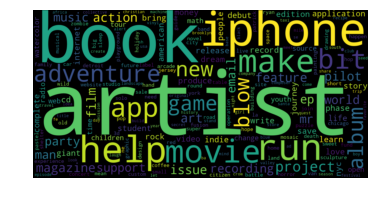

In [137]:
from wordcloud import WordCloud,STOPWORDS

# from nltk.stem.porter import PorterStemmer
from ast import literal_eval

def tokenize(text):
#     stemmeren = PorterStemmer()
    lowercase = [tkn.lower() for tkn in text]
    
    stop_rm = [wd for wd in lowercase if not wd in STOPWORDSEN]
#     stem = [stemmeren.stem(wd) for wd in stop_rm]
    return [j for j in stop_rm if j]

# load stop words list
stopWordsSet = sc.textFile("stop-word-list.txt").collect()
STOPWORDSEN = set(stopWordsSet)

with open('data_keywords.txt','r') as f:
    fd = f.read()
res = literal_eval(fd)
res = tokenize(res)
length = len(res)
print(length)
# print(type(res))
    
# Read the whole text.

# Generate a word cloud image
wordcloud = WordCloud(stopwords=STOPWORDS,width=1200,height=600,scale=1.5).generate_from_text(','.join(res))

# Display the generated image:
# the matplotlib way:
import matplotlib.pyplot as plt
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# The pil way (if you don't have matplotlib)
# image = wordcloud.to_image()
# image.show()